# ***`Train Models on Augmented Data`***
---
## **EDA Infromed Strategies:**
---

### 1) Sampling from Actual Distribution:
- **Strategy**: Augmentation parameters (like brightness and contrast) are drawn from the actual statistical distribution observed in the dataset.
- **Benefits**:
  - Augmentations are more representative of the most common variations within the data.
  - Higher probability of drawing values around the mean if the distribution is normal, reflecting the common scenarios in the dataset.
- **Implementation**: Ideal for scenarios where maintaining data realism and typicality is crucial.

### 2) Uniform Sampling:
- **Strategy**: Parameters for augmentation are drawn uniformly across the observed range (min to max) of the dataset features.
- **Benefits**:
  - Each value within the range has an equal chance of being selected, promoting exposure to a wide variety of conditions.
  - Useful for ensuring robustness to rare but possible real-world variations.
- **Implementation**: Suitable for applications where the model needs to perform well across a diverse set of conditions, including rare cases.

### Conclusion
Selecting the right data augmentation strategy involves considering the specific needs of the task, the nature of the dataset, and the computational resources available. On-the-fly augmentation and pre-generated augmented datasets offer flexibility and efficiency in different scenarios. Meanwhile, choosing between actual distribution-based augmentation and uniform sampling can depend on how closely the augmented data needs to reflect typical versus varied real-world conditions.

---


In [1]:
!pip install lightning einops

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 811.0/811.0 kB 21.8 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 866.2/866.2 kB 79.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 55.3 MB/s eta 0:00:00


In [35]:
# cuda available?
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [36]:
import torch
import numpy as np
import random

def set_seed(seed=14473):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # For multi-GPU, but also useful to be consistent on single GPU
    
    # Ensure deterministic behavior in PyTorch
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    print(f"Seed set to {seed} for reproducibility.")

# Example: set a seed
set_seed(14473)


Seed set to 14473 for reproducibility.


In [37]:
def worker_init_fn(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)


## ***`Helpers`***
---

In [38]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
import torch

def calculate_metrics(y_true, y_pred):
    return {
        'accuracy': accuracy_score(y_true, y_pred),
        'f1_micro': f1_score(y_true, y_pred, average='micro'),
        'f1_macro': f1_score(y_true, y_pred, average='macro'),
        'precision_micro': precision_score(y_true, y_pred, average='micro'),
        'precision_macro': precision_score(y_true, y_pred, average='macro'),
        'recall_micro': recall_score(y_true, y_pred, average='micro'),
        'recall_macro': recall_score(y_true, y_pred, average='macro')
    }

import torch

def evaluate_model(model, data_module, device, threshold=0.5, split='test'):
    model.to(device)  # Ensure model is on the correct device
    model.eval()  # Set the model to evaluation mode
    all_preds = []
    all_labels = []
    
    # Use the appropriate dataloader from the data module
    dataloader = data_module.test_dataloader() if split == 'test' \
                 else data_module.val_dataloader() if split == 'val' \
                 else data_module.train_dataloader()
    
    with torch.no_grad():  # Disable gradient calculation for evaluation
        for batch in dataloader:
            inputs, labels = batch
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            outputs = model(inputs)
            preds = (torch.sigmoid(outputs) > threshold).long()  # Apply sigmoid and threshold
            
            all_preds.append(preds.cpu())
            all_labels.append(labels.cpu())
    
    all_preds = torch.cat(all_preds).numpy()
    all_labels = torch.cat(all_labels).numpy()
    
    # Calculate metrics
    metrics = calculate_metrics(all_labels, all_preds)
    
    return metrics




import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')

def plot_metrics_curves(model):
    train_epochs = range(len(model.train_losses))
    val_epochs = range(len(model.val_losses))
    
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))  # 1 row, 4 columns

    # Common plot properties
    line_width = 4
    train_color = "#007BFF"
    val_color = "#FF4500"
    tick_label_size = 16
    legend_properties = {
        'facecolor': 'white',
        'edgecolor': 'black',
        'shadow': True,
        'loc': 'upper right',
        'fontsize': 18
    }

    # Calculate final deltas for each metric
    delta_loss = model.train_losses[-1] - model.val_losses[-1]
    delta_f1 = model.train_f1_scores[-1] - model.val_f1_scores[-1]
    delta_precision = model.train_precisions[-1] - model.val_precisions[-1]
    delta_recall = model.train_recalls[-1] - model.val_recalls[-1]

    # Plotting the loss curves
    axs[0].plot(train_epochs, model.train_losses, label='Training', color=train_color, linewidth=line_width)
    axs[0].plot(val_epochs, model.val_losses, label='Validation', color=val_color, linewidth=line_width)
    axs[0].set_title(f'Loss\nΔ={delta_loss:.2f}', fontsize=25, weight='bold', pad=15)

    axs[0].set_xlabel('Epochs', fontsize=20, weight='bold')
    axs[0].set_ylabel('Metric Value', fontsize=20, weight='bold')
    axs[0].tick_params(axis='both', which='major', labelsize=tick_label_size)
    axs[0].legend(**legend_properties)

    # Plotting the F1 score curves
    axs[1].plot(train_epochs, model.train_f1_scores, label='Training', color=train_color, linewidth=line_width)
    axs[1].plot(val_epochs, model.val_f1_scores, label='Validation', color=val_color, linewidth=line_width)
    axs[1].set_title(f'F1 Score\nΔ={delta_f1:.2f}', fontsize=25, weight='bold', pad=15)
    axs[1].set_xlabel('Epochs', fontsize=20, weight='bold')
    axs[1].set_ylim(0, 1)
    axs[1].tick_params(axis='both', which='major', labelsize=tick_label_size)

    # Plotting the Precision curves
    axs[2].plot(train_epochs, model.train_precisions, label='Training', color=train_color, linewidth=line_width)
    axs[2].plot(val_epochs, model.val_precisions, label='Validation', color=val_color, linewidth=line_width)
    axs[2].set_title(f'Precision\nΔ={delta_precision:.2f}', fontsize=25, weight='bold', pad=15)
    axs[2].set_xlabel('Epochs', fontsize=20, weight='bold')
    axs[2].set_ylim(0, 1)
    axs[2].tick_params(axis='both', which='major', labelsize=tick_label_size)

    # Plotting the Recall curves
    axs[3].plot(train_epochs, model.train_recalls, label='Training', color=train_color, linewidth=line_width)
    axs[3].plot(val_epochs, model.val_recalls, label='Validation', color=val_color, linewidth=line_width)
    axs[3].set_title(f'Recall\nΔ={delta_recall:.2f}', fontsize=25, weight='bold', pad=15)
    axs[3].set_xlabel('Epochs', fontsize=20, weight='bold')
    axs[3].set_ylim(0, 1)
    axs[3].tick_params(axis='both', which='major', labelsize=tick_label_size)

    plt.tight_layout()
    plt.show();



    
    
    
from PIL import Image
import torchvision.transforms as transforms
import torch

def preprocess_single_image(image_path, img_size=300, padding_mode='reflect'):
    """
    Load and preprocess a single image using the same transformation as in CoralDataModule.

    Parameters:
    - image_path: Path to the input image.
    - img_size: Target image size (default: 300x300).
    - padding_mode: Padding mode to be used ('reflect' or 'edge').

    Returns:
    - A preprocessed image tensor ready for input into the model.
    """
    def custom_pad(img):
        left = top = right = bottom = 0
        if img.width < img_size or img.height < img_size:
            delta_w = max(img_size - img.width, 0)
            delta_h = max(img_size - img.height, 0)
            left = delta_w // 2
            right = delta_w - left
            top = delta_h // 2
            bottom = delta_h - top
        return transforms.functional.pad(img, (left, top, right, bottom), padding_mode=padding_mode)
    
    # Create the transform pipeline
    transform = transforms.Compose([
        transforms.Lambda(custom_pad),
        transforms.Resize((img_size, img_size)),  # Ensure the image is resized to the target size
        transforms.ToTensor(),  # Convert image to tensor
    ])
    
    # Load the image
    image = Image.open(image_path).convert("RGB")  # Ensure the image is in RGB format

    # Apply the transformations
    image_tensor = transform(image)
    
    return image_tensor    
    
import matplotlib.pyplot as plt
import torch

def plot_original_images(input_images):
    """
    Plot the original images in a single row.

    Parameters:
    - input_images: A list of input image tensors (C, H, W).

    Returns:
    - None (displays the plot)
    """
    num_images = len(input_images)
    fig, axes = plt.subplots(1, num_images, figsize=(7 * num_images, 7))  # Create a row of subplots

    for idx, input_image in enumerate(input_images):
        # Convert the image tensor to a format suitable for plotting
        original_img = input_image.permute(1, 2, 0).cpu().numpy()
        axes[idx].imshow(original_img)
        axes[idx].axis('off')
        axes[idx].set_title(
            f"#{idx + 1}", 
            fontsize=30, weight='bold'
        )

    plt.tight_layout()
    plt.show()

import matplotlib.pyplot as plt
import torch
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable
import cv2

def visualize_average_attention_maps(model, input_images):
    """
    Visualize the average attention maps from the Vision Transformer overlaid on the original images in a single row 
    with a single colorbar at the end.

    Parameters:
    - model: The trained Vision Transformer model.
    - input_images: A list of four input image tensors (C, H, W).

    Returns:
    - None (displays the plot)
    """
    model.eval()
    fig, axes = plt.subplots(1, 4, figsize=(28, 7))  # Create a row of 4 subplots

    for idx, input_image in enumerate(input_images):
        patch_size = model.patch_embedding.patch_size  # Dynamically get the patch size from the model
        img_size = input_image.shape[1]  # Assuming input_image is (C, H, W) and H == W
        
        with torch.no_grad():
            prediction, attn_maps = model(input_image.unsqueeze(0), return_attn=True)
        
        predicted_prob = torch.sigmoid(prediction).item()
        predicted_label = 'Healthy' if predicted_prob >= 0.5 else 'Bleached'

        # Use the last layer's attention map
        last_layer_attn = attn_maps[-1].squeeze(0)  # Assume batch size of 1 for simplicity

        # Calculate average attention map across all heads
        avg_attn_map = last_layer_attn.mean(0).cpu().numpy()

        # Reshape the attention map to match the number of patches
        num_patches = img_size // patch_size
        reshaped_attn_map = avg_attn_map[1:].reshape(num_patches, num_patches)  # Exclude the CLS token

        # Resize the attention map to match the image size using interpolation
        resized_attn_map = cv2.resize(reshaped_attn_map, (img_size, img_size), interpolation=cv2.INTER_LINEAR)

        # Normalize the resized attention map for better visualization
        resized_attn_map = (resized_attn_map - resized_attn_map.min()) / (resized_attn_map.max() - resized_attn_map.min())

        # Plot the original image and the attention map overlay
        original_img = input_image.permute(1, 2, 0).cpu().numpy()
        im = axes[idx].imshow(original_img)
        overlay = axes[idx].imshow(resized_attn_map, cmap='coolwarm', alpha=0.66)  # Adjust alpha to taste
        axes[idx].set_title(f"Pred: {predicted_label} (P: {predicted_prob:.2f})", fontsize=30, weight='bold')
        axes[idx].axis('off')

        # Only create the colorbar on the last subplot
        if idx == 3:
            divider = make_axes_locatable(axes[idx])
            cax = divider.append_axes("right", size="5%", pad=0.1)
            cbar = plt.colorbar(overlay, cax=cax)
            cbar.ax.tick_params(labelsize=25)  # Set the size of the tick labels

    plt.tight_layout()
    plt.show();
    

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def visualize_model_predictions(model, data_module):
    """
    Visualizes the prediction results of a pre-trained model by plotting the probability distributions
    for different quadrants of the confusion matrix using the test data provided by the data module.
    
    Parameters:
    - model: A pre-trained PyTorch model.
    - data_module: A PyTorch Lightning data module with a defined test dataloader.
    """
    # Ensure the model is in evaluation mode
    model.eval()
    test_loader = data_module.test_dataloader()
    predictions, labels = [], []

    # Collect predictions and labels from the test dataset
    with torch.no_grad():
        for batch in test_loader:
            inputs, y = batch
            inputs = inputs.to(model.device)
            logits = model(inputs)
            y_prob = torch.sigmoid(logits).cpu().numpy()  # Apply sigmoid if the model outputs logits
            predictions.extend(y_prob)
            labels.extend(y.cpu().numpy())

    # Create a DataFrame for the predictions and actual labels
    df_predictions = pd.DataFrame({
        'y': labels,
        'y_proba': np.array(predictions).flatten()
    })

    # Setup plot dimensions and style
    fig, axs = plt.subplots(ncols=2, nrows=2, sharex=True, sharey=True, figsize=(8, 7))
    bins = np.linspace(0, 1, 21)

    # Helper function to plot each quadrant of the confusion matrix
    def show_quarter(df, query, col, title, ax, bins, color, alpha, x_label=None, y_label=None):
        results = df.query(query)
        sns.histplot(results[col], kde=False, ax=ax, bins=bins, color=color, alpha=alpha)
        if y_label:
            ax.set_ylabel(y_label, fontsize=18.5)
        if x_label:
            ax.set_xlabel(x_label, fontsize=18.5)
        ax.set_title(f'{title} ({results.shape[0]})', fontsize=18.5, weight='bold')
        ax.axvline(x=0.5, color='red', linestyle='-.', linewidth=2)

        # Increase tick label font size
        ax.tick_params(axis='both', which='major', labelsize=15)

    # Visualize probabilities for each quadrant
    blue = "#007BFF"
    red = "#FF4500"
    show_quarter(df_predictions, "y==0 and y_proba < 0.5", "y_proba", "True Negatives", axs[0, 0], bins, blue, 0.6, y_label="False")
    show_quarter(df_predictions, "y==0 and y_proba >= 0.5", "y_proba", "False Positives", axs[0, 1], bins, red, 0.6)
    show_quarter(df_predictions, "y==1 and y_proba >= 0.5", "y_proba", "True Positives", axs[1, 1], bins, red, 0.6, x_label="Probability")
    show_quarter(df_predictions, "y==1 and y_proba < 0.5", "y_proba", "False Negatives", axs[1, 0], bins, blue, 0.6, x_label="Probability", y_label="True")

    # Configure common labels and title for the figure
    fig.text(0.5, 0.003, 'Predicted', ha='center', va='center', fontsize=18.5, weight='bold')
    fig.text(0.003, 0.5, 'True Label', ha='center', va='center', rotation='vertical', fontsize=18.5, weight='bold')
    #fig.suptitle("Model Predictions: Probabilities per Confusion Matrix Quadrant", fontsize=18)

    plt.tight_layout()
    plt.show()

## ***`Model Architecture`***
---

In [39]:
# Fourier-based embedding layer
import torch as th
import numpy as np

class NaiveFourierKANLayer(th.nn.Module):
    """ link: https://github.com/GistNoesis/FourierKAN/blob/main/fftKAN.py
    """
    def __init__( self, inputdim, outdim, gridsize, addbias=True, smooth_initialization=False):
        super(NaiveFourierKANLayer,self).__init__()
        self.gridsize = gridsize
        self.addbias  = addbias
        self.inputdim = inputdim
        self.outdim   = outdim

        # With smooth_initialization, fourier coefficients are attenuated by the square of their frequency.
        # This makes KAN's scalar functions smooth at initialization.
        # Without smooth_initialization, high gridsizes will lead to high-frequency scalar functions,
        # with high derivatives and low correlation between similar inputs.
        grid_norm_factor = (th.arange(gridsize) + 1)**2 if smooth_initialization else np.sqrt(gridsize)

        #The normalization has been chosen so that if given inputs where each coordinate is of unit variance,
        #then each coordinates of the output is of unit variance
        #independently of the various sizes
        self.fouriercoeffs = th.nn.Parameter( th.randn(2,outdim,inputdim,gridsize) /
                                                (np.sqrt(inputdim) * grid_norm_factor ) )
        if( self.addbias ):
            self.bias  = th.nn.Parameter( th.zeros(1,outdim))

    #x.shape ( ... , indim )
    #out.shape ( ..., outdim)
    def forward(self,x):
        xshp = x.shape
        outshape = xshp[0:-1]+(self.outdim,)
        x = th.reshape(x,(-1,self.inputdim))
        #Starting at 1 because constant terms are in the bias
        k = th.reshape( th.arange(1,self.gridsize+1,device=x.device),(1,1,1,self.gridsize))
        xrshp = th.reshape(x,(x.shape[0],1,x.shape[1],1) )
        #This should be fused to avoid materializing memory
        c = th.cos( k*xrshp )
        s = th.sin( k*xrshp )
        #We compute the interpolation of the various functions defined by their fourier coefficient for each input coordinates and we sum them
        y =  th.sum( c*self.fouriercoeffs[0:1],(-2,-1))
        y += th.sum( s*self.fouriercoeffs[1:2],(-2,-1))
        if( self.addbias):
            y += self.bias
        #End fuse
        '''
        #You can use einsum instead to reduce memory usage
        #It stills not as good as fully fused but it should help
        #einsum is usually slower though
        c = th.reshape(c,(1,x.shape[0],x.shape[1],self.gridsize))
        s = th.reshape(s,(1,x.shape[0],x.shape[1],self.gridsize))
        y2 = th.einsum( "dbik,djik->bj", th.concat([c,s],axis=0) ,self.fouriercoeffs )
        if( self.addbias):
            y2 += self.bias
        diff = th.sum((y2-y)**2)
        print("diff")
        print(diff) #should be ~0
        '''
        y = th.reshape( y, outshape)
        return y

In [40]:
import torch as th
import torch.nn as nn
import pytorch_lightning as pl
from torchmetrics import (
    Accuracy, Precision, Recall, F1Score
)
from einops.layers.torch import Rearrange
from einops import repeat
from torch.optim import Adam

class PatchEmbedding(nn.Module):
    """
    PatchEmbedding converts an input image into a sequence of patches for transformer models.

    Parameters
    ----------
    img_size : int
        Size of the input image (assumes square images).
    patch_size : int
        Size of each patch (height and width).
    in_channels : int
        Number of input channels (e.g., 3 for RGB).
    embed_size : int
        Dimensionality of the patch embeddings.
    embedding_type : str, optional, default='conv'
        Type of embedding ('conv', 'linear', 'fourier').
    fourier_params : dict, optional
        Parameters for the Fourier embedding if `embedding_type='fourier'`.

    Attributes
    ----------
    proj : nn.Sequential
        Layer for projecting input images to patch embeddings.
    cls_token : nn.Parameter
        Learnable token prepended to the patch sequence.
    positions : nn.Parameter
        Positional embeddings added to the sequence.

    Methods
    -------
    forward(x)
        Transforms `x` into a sequence of patch embeddings with positional encodings.

    Notes
    -----
    - The `Rearrange` operations reshape the input tensor to match the format required for different embedding types.
    - 'conv': [batch_size, embed_size, h, w] -> [batch_size, num_patches, embed_size].
    - 'linear', 'fourier': [batch_size, in_channels, h*p1, w*p2] -> [batch_size, num_patches, patch_vector_size].
    """
    def __init__(self, img_size, patch_size, in_channels, embed_size, embedding_type='conv', fourier_params=None):
        super().__init__()
        self.patch_size = patch_size
        self.in_channels = in_channels
        self.input_dim = patch_size * patch_size * in_channels

        if embedding_type == 'conv':
            self.proj = nn.Sequential(
                nn.Conv2d(in_channels, embed_size, kernel_size=patch_size, stride=patch_size),
                Rearrange('b e h w -> b (h w) e')  # Explicitly define h and w here
            )
        elif embedding_type == 'linear':
            self.proj = nn.Sequential(
                Rearrange('b c (h p1) (w p2) -> b (h w) (p1 p2 c)', p1=patch_size, p2=patch_size),
                nn.Linear(self.input_dim, embed_size)
            )
        elif embedding_type == 'fourier':
            if fourier_params == None:
                fourier_params = {}
                
            self.proj = nn.Sequential(
                Rearrange('b c (h p1) (w p2) -> b (h w) (p1 p2 c)', p1=patch_size, p2=patch_size),
                NaiveFourierKANLayer(self.input_dim, embed_size, **fourier_params)
            )
        else:
            raise ValueError("Invalid embedding_type. Choose 'conv', 'linear', or 'fourier'")

        self.cls_token = nn.Parameter(th.randn(1, 1, embed_size))
        self.positions = nn.Parameter(th.randn((img_size // patch_size) ** 2 + 1, embed_size))

    def forward(self, x):
        """
        Forward pass: Transforms the input image into a sequence of patch embeddings with positional encodings.

        Parameters
        ----------
        x : torch.Tensor
            Input tensor of shape [batch_size, in_channels, img_size, img_size].

        Returns
        -------
        torch.Tensor
            Output tensor of shape [batch_size, num_patches + 1, embed_size], where `num_patches` is the number of
            patches in the image, and the additional dimension corresponds to the classification token.

        Notes
        -----
        - `cls_tokens = repeat(self.cls_token, '() n e -> b n e', b=b)`:
            This line replicates the learnable classification token (`cls_token`) across the batch dimension `b`.
            The `repeat` function is used to create a tensor of shape [batch_size, 1, embed_size] by repeating 
            the `cls_token` for each image in the batch, preparing it to be concatenated with the patch embeddings.
        """
        b, _, _, _ = x.shape
        x = self.proj(x)
        cls_tokens = repeat(self.cls_token, '() n e -> b n e', b=b)
        x = th.cat([cls_tokens, x], dim=1)
        x += self.positions
        return x


class TransformerBlock(nn.Module):
    def __init__(self, embed_size, heads, mlp_dim, dropout):
        super().__init__()
        self.norm1 = nn.LayerNorm(embed_size)
        self.attn = nn.MultiheadAttention(embed_dim=embed_size, num_heads=heads, dropout=dropout)
        self.norm2 = nn.LayerNorm(embed_size)
        self.mlp = nn.Sequential(
            nn.Linear(embed_size, mlp_dim),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(mlp_dim, embed_size),
            nn.Dropout(dropout)
        )

    def forward(self, x, return_attn=False):
        x = self.norm1(x)
        x = x.permute(1, 0, 2)
        attn_output, attn_weights = self.attn(x, x, x)
        attn_output = attn_output.permute(1, 0, 2)
        x = self.norm2(x.permute(1, 0, 2) + attn_output)
        x2 = self.mlp(x)
        if return_attn:
            return x + x2, attn_weights
        return x + x2

class ViT(pl.LightningModule):
    def __init__(
        self, 
        img_size=300, 
        patch_size=4,
        in_channels=1,
        embed_size=64,
        depth=8,
        heads=4,
        mlp_dim=128,
        dropout=0.1, 
        learning_rate=1e-3,  
        embedding_type='conv',
        fourier_params=None
    ):
        super().__init__()
        
        # parameters
        self.learning_rate = learning_rate
        
        self.patch_embedding = PatchEmbedding(
            img_size, patch_size, in_channels, embed_size, embedding_type, fourier_params=fourier_params
        )
        self.transformer_blocks = nn.Sequential(
            *[TransformerBlock(embed_size, heads, mlp_dim, dropout) for _ in range(depth)]
        )
        self.to_cls_token = nn.Identity()
        self.mlp_head = nn.Sequential(
            nn.LayerNorm(embed_size),
            nn.Linear(embed_size, 1)  # Change to 1 for binary classification
        )
        
        # Metrics
        self.train_accuracy = Accuracy(task="binary")
        self.val_accuracy = Accuracy(task="binary")
        self.test_accuracy = Accuracy(task="binary")
        
        self.train_f1 = F1Score(task="binary", average='micro')
        self.val_f1 = F1Score(task="binary", average='micro')
        self.test_f1 = F1Score(task="binary", average='micro')
        
        self.train_precision = Precision(task="binary", average='micro')
        self.val_precision = Precision(task="binary", average='micro')
        self.test_precision = Precision(task="binary", average='micro')
        
        self.train_recall = Recall(task="binary", average='micro')
        self.val_recall = Recall(task="binary", average='micro')
        self.test_recall = Recall(task="binary", average='micro')
        
        self.loss_fn = nn.BCEWithLogitsLoss()
        
        # manually store losses for plt/sns vizualization
        self.train_losses = []
        self.val_losses   = []
        
        self.train_f1_scores = []
        self.val_f1_scores = []
        
        self.train_precisions = []
        self.val_precisions = []
        
        self.train_recalls = []
        self.val_recalls = []

        
    #def forward(self, x):
    #    x = self.patch_embedding(x)
    #    x = self.transformer_blocks(x)
    #    x = self.to_cls_token(x[:, 0])
    #    return self.mlp_head(x).squeeze(-1)  # Ensure the output is the correct shape
    
    def forward(self, x, return_attn=False):
        x = self.patch_embedding(x)
        attn_maps = []
        for block in self.transformer_blocks:
            if return_attn:
                x, attn_weights = block(x, return_attn=True)
                attn_maps.append(attn_weights)
            else:
                x = block(x)
        x = self.to_cls_token(x[:, 0])
        output = self.mlp_head(x).squeeze(-1)
        if return_attn:
            return output, attn_maps
        return output
    
    def get_attention_maps(self, x):
        if x.dim() == 3:
            x = x.unsqueeze(0)  # Add batch dimension if it's missing
        x = self.patch_embedding(x)
        attn_maps = []
        for i, block in enumerate(self.transformer_blocks):
            x, attn_weights = block(x, return_attn=True)
            print(f"Layer {i+1} attention shape: {attn_weights.shape}")
            attn_maps.append(attn_weights)
        return attn_maps

    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.loss_fn(logits, y.float())
        preds = torch.sigmoid(logits)  # Convert logits to probabilities
        
        acc = self.train_accuracy(preds, y)
        f1 = self.train_f1(preds, y)
        precision = self.train_precision(preds, y)
        recall = self.train_recall(preds, y)
        
        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log('train_acc', acc, on_step=False, on_epoch=True, prog_bar=True)
        self.log('train_f1', f1, on_step=False, on_epoch=True, prog_bar=True)
        self.log('train_precision', precision, on_step=False, on_epoch=True, prog_bar=True)
        self.log('train_recall', recall, on_step=False, on_epoch=True, prog_bar=True)
        
        return {
            'loss': loss,
            'train_f1': f1,
            'train_precision': precision,
            'train_recall': recall
        }
    
    def on_train_epoch_end(self):
        # Store the average training loss for this epoch
        avg_train_loss = self.trainer.callback_metrics["train_loss"].item()
        self.train_losses.append(avg_train_loss)
        
        avg_train_f1 = self.trainer.callback_metrics["train_f1"].item()
        self.train_f1_scores.append(avg_train_f1)
        
        avg_train_precision = self.trainer.callback_metrics["train_precision"].item()
        self.train_precisions.append(avg_train_precision)
        
        avg_train_recall = self.trainer.callback_metrics["train_recall"].item()
        self.train_recalls.append(avg_train_recall)
        

    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.loss_fn(logits, y.float())
        preds = torch.sigmoid(logits)  # Convert logits to probabilities
        
        acc = self.val_accuracy(preds, y)
        f1 = self.val_f1(preds, y)
        precision = self.val_precision(preds, y)
        recall = self.val_recall(preds, y)
        
        self.log('val_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log('val_acc', acc, on_step=False, on_epoch=True, prog_bar=True)
        self.log('val_f1', f1, on_step=False, on_epoch=True, prog_bar=True)
        self.log('val_precision', precision, on_step=False, on_epoch=True, prog_bar=True)
        self.log('val_recall', recall, on_step=False, on_epoch=True, prog_bar=True)
        
        return {
            'val_loss': loss,
            'val_f1': f1,
            'val_precision': precision,
            'val_recall': recall
        }
    
    def on_validation_epoch_end(self):
        # Store the average validation loss for this epoch
        avg_val_loss = self.trainer.callback_metrics["val_loss"].item()
        self.val_losses.append(avg_val_loss)
        
        avg_val_f1 = self.trainer.callback_metrics["val_f1"].item()
        self.val_f1_scores.append(avg_val_f1)
        
        avg_val_precision = self.trainer.callback_metrics["val_precision"].item()
        self.val_precisions.append(avg_val_precision)
        
        avg_val_recall = self.trainer.callback_metrics["val_recall"].item()
        self.val_recalls.append(avg_val_recall)
        
    
    def test_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.loss_fn(logits, y.float())
        preds = torch.sigmoid(logits)  # Convert logits to probabilities
        
        acc = self.test_accuracy(preds, y)
        f1 = self.test_f1(preds, y)
        precision = self.test_precision(preds, y)
        recall = self.test_recall(preds, y)
        
        self.log('test_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log('test_acc', acc, on_step=False, on_epoch=True, prog_bar=True)
        self.log('test_f1', f1, on_step=False, on_epoch=True, prog_bar=True)
        self.log('test_precision', precision, on_step=False, on_epoch=True, prog_bar=True)
        self.log('test_recall', recall, on_step=False, on_epoch=True, prog_bar=True)
        
        return loss

    def configure_optimizers(self):
        return Adam(self.parameters(), lr=self.learning_rate)

## ***`EDA`***
---
### **Brightness, Contrast & Saturation**

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


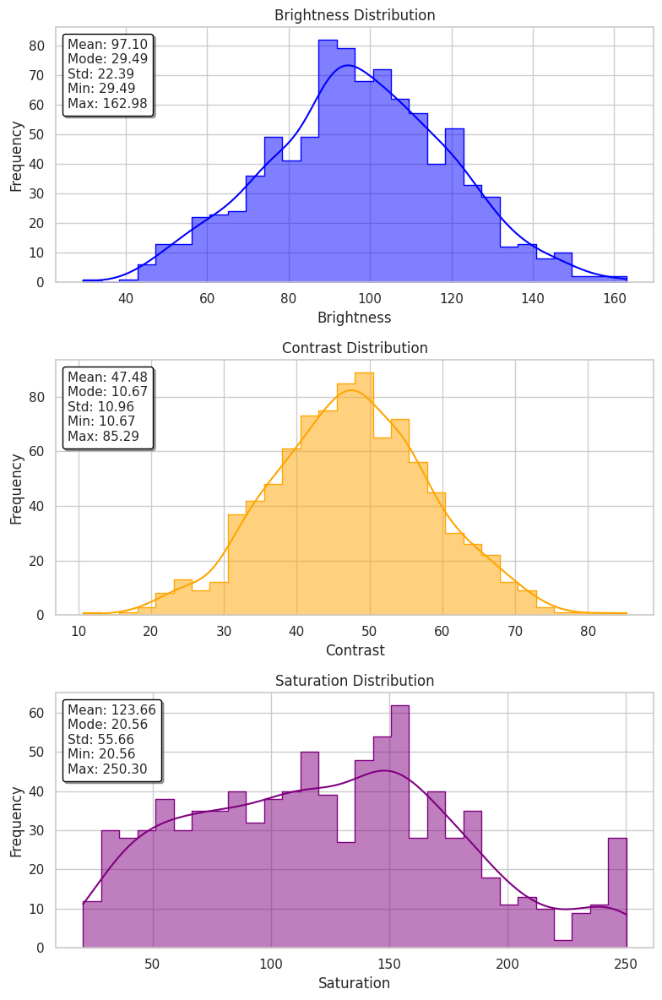

In [6]:
import os
import numpy as np
import pandas as pd
from PIL import Image, ImageStat
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.lines as mlines
from scipy import stats as sp_stats

def load_images_from_folder(folder, file_extension=".jpg"):
    """ Load images from a directory and return them as numpy arrays. """
    images = []
    for filename in os.listdir(folder):
        if filename.endswith(file_extension):
            img_path = os.path.join(folder, filename)
            with Image.open(img_path) as img:
                images.append(np.array(img))
    return images

def calculate_brightness(image_np):
    """ Calculate the average brightness of an image array. """
    image = Image.fromarray(image_np)
    stat = ImageStat.Stat(image)
    return sum(stat.mean) / 3  # Average of R, G, B channels

def calculate_contrast(image_np):
    """ Calculate the contrast of an image array. """
    image = Image.fromarray(image_np).convert('L')
    stat = ImageStat.Stat(image)
    return stat.stddev[0]  # Standard deviation of grayscale image

def calculate_saturation(image_np):
    """ Calculate the average saturation of an image array. """
    image = Image.fromarray(image_np).convert('HSV')
    s_channel = np.array(image)[:, :, 1]
    return np.mean(s_channel)  # Average saturation

# Paths to your image directories
common_dir = '/notebooks/attention/coral_original'
bleached_dir = f'{common_dir}/bleached_corals'
healthy_dir = f'{common_dir}/healthy_corals'

# Load images
bleached_images = load_images_from_folder(bleached_dir)
healthy_images = load_images_from_folder(healthy_dir)

# Initialize lists for storing statistics
all_stats = {
    'brightness': [],
    'contrast': [],
    'saturation': []
}

# Process all images
for img_np in bleached_images + healthy_images:
    all_stats['brightness'].append(calculate_brightness(img_np))
    all_stats['contrast'].append(calculate_contrast(img_np))
    all_stats['saturation'].append(calculate_saturation(img_np))

# Convert statistics to DataFrame for easy analysis
stats_df = pd.DataFrame(all_stats)

# Plotting the statistics with different hues using seaborn
sns.set(style="whitegrid")  # Set the style of seaborn plots
fig, axs = plt.subplots(3, 1, figsize=(8, 12))

def plot_stats(ax, data, color, stat_name):
    # Use pandas describe to calculate statistics
    desc = data.describe()
    
    # Calculate mode separately
    mode = sp_stats.mode(data)[0]
    mode = mode[0] if isinstance(mode, np.ndarray) else mode

    # Format the statistics in the legend
    legend_text = (
        f'Mean: {desc["mean"]:.2f}\n'
        f'Mode: {mode:.2f}\n'
        f'Std: {desc["std"]:.2f}\n'
        f'Min: {desc["min"]:.2f}\n'
        f'Max: {desc["max"]:.2f}'
    )

    sns.histplot(data, bins=30, color=color, kde=True, ax=ax, element='step')
    ax.set_title(f'{stat_name} Distribution')
    ax.set_xlabel(stat_name)
    ax.set_ylabel('Frequency')
    
    # Create a custom Line2D object to display stats without color indicators
    custom_legend = [mlines.Line2D([], [], color='none', label=legend_text)]
    ax.legend(handles=custom_legend, loc='upper left', handlelength=0, handletextpad=0, fancybox=True, shadow=True, edgecolor='black')

# Plot each of the statistics
plot_stats(axs[0], stats_df['brightness'], 'blue', 'Brightness')
plot_stats(axs[1], stats_df['contrast'], 'orange', 'Contrast')
plot_stats(axs[2], stats_df['saturation'], 'purple', 'Saturation')

plt.tight_layout()
plt.show();


### Calculate distribution params:

In [41]:
import os
from PIL import Image, ImageStat
import numpy as np

def calculate_image_statistics(image_path):
    with Image.open(image_path) as img:
        img = img.convert('RGB')
        
        # Calculate brightness
        stat = ImageStat.Stat(img)
        brightness = sum(stat.mean) / 3
        
        # Calculate contrast
        contrast = np.std([pixel for pixel_row in np.array(img) for pixel in pixel_row])

        # Convert to HSV for saturation
        img_hsv = img.convert('HSV')
        saturation = np.std([s for v_row in np.array(img_hsv) for s in v_row[:, 1]])
        
        return brightness, contrast, saturation

def analyze_dataset(data_dir):
    statistics = {}
    
    for class_folder in os.listdir(data_dir):
        class_path = os.path.join(data_dir, class_folder)
        statistics[class_folder] = {'brightness': [], 'contrast': [], 'saturation': []}
        
        for image_name in os.listdir(class_path):
            image_path = os.path.join(class_path, image_name)
            brightness, contrast, saturation = calculate_image_statistics(image_path)
            statistics[class_folder]['brightness'].append(brightness)
            statistics[class_folder]['contrast'].append(contrast)
            statistics[class_folder]['saturation'].append(saturation)
    
    # Calculate distribution parameters and range for uniform sampling
    distribution_params = {}
    for class_type, attrs in statistics.items():
        distribution_params[class_type] = {}
        for attr, values in attrs.items():
            distribution_params[class_type][attr] = {
                'mean': np.mean(values),
                'std': np.std(values),
                'min': np.min(values),
                'max': np.max(values)
            }
    
    return distribution_params # Includes mean, std, min, max

# Usage
data_dir = '/notebooks/attention/coral_original'
distribution_params = analyze_dataset(data_dir)
distribution_params

{'bleached_corals': {'brightness': {'mean': 98.82946775495414,
   'std': 23.97785877189843,
   'min': 29.49185185185185,
   'max': 162.97826666666666},
  'contrast': {'mean': 55.53237532463489,
   'std': 11.10172000286953,
   'min': 26.368722152539657,
   'max': 102.2323504898646},
  'saturation': {'mean': 46.93895392924845,
   'std': 20.355629821300322,
   'min': 6.291682220790192,
   'max': 99.2353243912925}},
 'healthy_corals': {'brightness': {'mean': 95.20909379049573,
   'std': 20.249367499563093,
   'min': 44.468409876543205,
   'max': 156.7421921921922},
  'contrast': {'mean': 60.88567485932063,
   'std': 11.448276369787974,
   'min': 32.47556463111988,
   'max': 92.66281500510674},
  'saturation': {'mean': 64.93475203987401,
   'std': 18.296750825620926,
   'min': 10.763930606284113,
   'max': 99.76457345833407}}}

## ***`1) Empirical Phase Augmentation (EPA)`***
---
- ***`Empirical`***: Your method's reliance on empirical data (learning curves) to make decisions.
- ***`Phase`***: The phased approach, transitioning from non-augmented to augmented training.
- ***`Augmentation`***: The introduction of data augmentation to enhance model training after initial exposure to unaltered images.

---

The strategy of training a deep learning model initially on original, unaltered images for a fixed number of epochs before introducing data augmentation is a nuanced approach that combines elements of curriculum learning and traditional augmentation techniques. Below, we explore the potential benefits, key considerations, and implementation suggestions for this strategy.

### Potential Benefits

1. **Feature Foundation**: Beginning the training process with unaltered images helps the model learn fundamental features and patterns without the interference of augmentation noise. This could be particularly beneficial for complex models or datasets with intricate details.

2. **Curriculum Learning**: This method aligns with the principles of curriculum learning, where the model is exposed to simpler tasks initially and gradually introduced to more complex scenarios. This sequential learning process can potentially lead to better convergence and model stability.

3. **Loss Curve Analysis**: Training initially without augmentation allows for the observation of the loss curve to determine when the model starts to plateau or overfit. This insight can guide when to introduce augmented data to maximize learning efficiency and effectiveness.

### Key Considerations

1. **Compute Resources**: Training in two distinct phases might require more overall epochs, potentially increasing computational costs and training time.

2. **Risk of Overfitting**: There's a risk that the model could overfit to the original, unaltered images during the initial phase. Although introducing augmentation later can help, some early overfitting effects might remain.

3. **Optimal Switch Point**: Identifying the best moment to transition from non-augmented to augmented training could vary between datasets and models, necessitating experimental validation to optimize.

### Implementation Suggestions

- **Conditional Augmentation**: Implement a conditional mechanism in the data loading process that enables or disables augmentation based on the epoch number. This allows the model to start training on unaltered data and switch to augmented data at a predetermined epoch.
- **Epoch Monitoring**: Monitor the training process closely, especially during the initial phase without augmentation, to identify the point at which the loss curve begins to plateau, suggesting a good time to introduce augmentation.

### Empirical Testing

To validate the effectiveness of this phased training approach, it's crucial to conduct empirical testing:

1. **Ablation Study**: Perform an ablation study where you train the same model architecture with different switch points to identify which yields the best balance of training efficiency and model performance.

2. **Baseline Comparison**: Compare the results of the phased training approach against a baseline model trained with continuous augmentation from the start. This comparison should look at metrics such as accuracy, generalization to unseen data, and training time.

3. **Statistical Analysis**: Use statistical methods to analyze the results from different training experiments to ascertain the significance and reliability of observed differences in model performance.

### Conclusion

Starting training with non-augmented images and then switching to augmented training represents a thoughtful approach to potentially enhance model robustness and generalization. However, its success depends on careful implementation, monitoring, and empirical validation to fine-tune the strategy to specific use cases.


In [29]:
import random
import pytorch_lightning as pl
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import train_test_split

class RandomAdjustment(torch.nn.Module):
    def __init__(self, actual_dist_params, uniform_params, transform_type):
        super().__init__()
        self.actual_dist_params = actual_dist_params
        self.uniform_params = uniform_params
        self.transform_type = transform_type

    def forward(self, img, label, use_uniform=False):
        class_key = 'bleached' if label == 0 else 'healthy'
        if use_uniform:
            param = random.uniform(*self.uniform_params[self.transform_type])
        else:
            param = random.normalvariate(*self.actual_dist_params[class_key][self.transform_type])

        if self.transform_type == 'brightness':
            img = transforms.functional.adjust_brightness(img, param)
        elif self.transform_type == 'contrast':
            img = transforms.functional.adjust_contrast(img, param)
        elif self.transform_type == 'saturation':
            img = transforms.functional.adjust_saturation(img, param)
        return img

class CoralDataModuleAugmentOnTheFlyPhased(pl.LightningDataModule):
    """ With default, single padding mode"""
    def __init__(self, data_dir, batch_size, img_size, scaler_type, test_size, val_size, num_workers, padding_mode, dist_params, use_uniform=False, start_augmentation_epoch=0):
        super().__init__()
        self.data_dir = data_dir
        self.batch_size = batch_size
        self.img_size = img_size
        self.scaler_type = scaler_type
        self.test_size = test_size
        self.val_size = val_size
        self.num_workers = num_workers
        self.padding_mode = padding_mode
        self.use_uniform = use_uniform
        self.dist_params = dist_params
        self.start_augmentation_epoch = start_augmentation_epoch
        self.current_epoch = 0

        # Initialize adjustment instances
        self.brightness_adjustment = RandomAdjustment(dist_params, {'brightness': (0.5, 1.5)}, 'brightness')
        self.contrast_adjustment = RandomAdjustment(dist_params, {'contrast': (0.5, 1.5)}, 'contrast')
        self.saturation_adjustment = RandomAdjustment(dist_params, {'saturation': (0.5, 1.5)}, 'saturation')

        self.transform = self.get_transform(apply_augmentation=False)
        self.train_transform = self.get_transform(apply_augmentation=True)

    def custom_pad(self, img):
        left = top = right = bottom = 0
        if img.width < self.img_size or img.height < self.img_size:
            delta_w = max(self.img_size - img.width, 0)
            delta_h = max(self.img_size - img.height, 0)
            left = delta_w // 2
            right = delta_w - left
            top = delta_h // 2
            bottom = delta_h - top
        return transforms.functional.pad(img, (left, top, right, bottom), padding_mode=self.padding_mode)

    def get_transform(self, apply_augmentation=False):
        """
        Selects the appropriate scaling transform based on the `scaler_type`.
        """
        base_transforms = [
            transforms.Lambda(self.custom_pad),
            transforms.Resize((self.img_size, self.img_size)),
            transforms.ToTensor(),
        ]
        
        # Apply scaling based on `scaler_type`
        if self.scaler_type == 'min-max':
            # Default: ToTensor scales between 0 and 1, no extra scaling needed
            pass  # No extra transform needed for min-max
        elif self.scaler_type == 'pi-scale':
            # Scale data to [-pi, +pi]
            base_transforms.append(transforms.Lambda(lambda x: x * 2 * np.pi - np.pi))
        else:
            raise ValueError(f"Unknown scaler_type: {self.scaler_type}. Choose among 'min-max' and 'pi-scale'!")
        
        # If augmentations are to be applied
        if apply_augmentation:
            augmentation_transforms = [
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomVerticalFlip(p=0.2),
                lambda x, y: (self.apply_adjustment(x, y), y)
            ]
            return transforms.Compose(augmentation_transforms + base_transforms)
        
        return transforms.Compose(base_transforms)

    def apply_adjustment(self, img, label):
        img = self.brightness_adjustment(img, label, use_uniform=self.use_uniform)
        img = self.contrast_adjustment(img, label, use_uniform=self.use_uniform)
        img = self.saturation_adjustment(img, label, use_uniform=self.use_uniform)
        return img

    def on_train_epoch_start(self):
        """ Dynamically update the transform based on the current epoch. """
        if self.current_epoch >= self.start_augmentation_epoch:
            self.train_dataset.dataset.transform = self.train_transform
        else:
            self.train_dataset.dataset.transform = self.get_transform(apply_augmentation=False)
        self.current_epoch += 1

    def setup(self, stage=None):
        if stage == 'fit' or stage is None:
            full_dataset = datasets.ImageFolder(root=self.data_dir, is_valid_file=lambda x: x.endswith(('.jpg', '.jpeg', '.png')))
            
            train_idx, val_idx = train_test_split(
                range(len(full_dataset)),
                test_size=self.val_size + self.test_size,
                shuffle=True,
                stratify=full_dataset.targets,
                random_state=14473
            )
            
            self.train_dataset = Subset(full_dataset, train_idx)
            self.train_dataset.dataset.transform = self.train_transform
            
            val_test_idx, test_idx = train_test_split(
                val_idx,
                test_size=self.test_size / (self.val_size + self.test_size),
                shuffle=True,
                stratify=[full_dataset.targets[i] for i in val_idx],
                random_state=14473
            )
            
            self.val_dataset = Subset(full_dataset, val_test_idx)
            self.val_dataset.dataset.transform = self.transform
            self.test_dataset = Subset(full_dataset, test_idx)
            self.test_dataset.dataset.transform = self.transform
            print("Successfully initialized data loaders!")


    def train_dataloader(self):
        return DataLoader(self.train_dataset, batch_size=self.batch_size, shuffle=True, num_workers=self.num_workers, pin_memory=True)

    def val_dataloader(self):
        return DataLoader(self.val_dataset, batch_size=self.batch_size, shuffle=False, num_workers=self.num_workers, pin_memory=True)

    def test_dataloader(self):
        return DataLoader(self.test_dataset, batch_size=self.batch_size, shuffle=False, num_workers=self.num_workers, pin_memory=True)


In [43]:
import random
import pytorch_lightning as pl
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import train_test_split

class RandomAdjustment(torch.nn.Module):
    def __init__(self, dist_params, transform_type):
        super().__init__()
        self.dist_params = dist_params
        self.transform_type = transform_type

    def forward(self, img, label, use_uniform=False):
        class_key = 'bleached_corals' if label == 0 else 'healthy_corals'
        params = self.dist_params[class_key][self.transform_type]
        
        if use_uniform:
            param = random.uniform(params['min'], params['max'])
        else:
            param = random.normalvariate(params['mean'], params['std'])

        if self.transform_type == 'brightness':
            img = transforms.functional.adjust_brightness(img, param / 255.0)  # Normalize to [0, 1]
        elif self.transform_type == 'contrast':
            img = transforms.functional.adjust_contrast(img, param / 127.5)  # Normalize to roughly [0, 2]
        elif self.transform_type == 'saturation':
            img = transforms.functional.adjust_saturation(img, param / 127.5)  # Normalize to roughly [0, 2]
        return img

class CoralDataModuleAugmentOnTheFlyPhased(pl.LightningDataModule):
    def __init__(self, data_dir, batch_size, img_size, scaler_type, test_size, val_size, num_workers, dist_params, padding_modes, use_uniform=False, start_augmentation_epoch=0):
        super().__init__()
        self.data_dir = data_dir
        self.batch_size = batch_size
        self.img_size = img_size
        self.scaler_type = scaler_type
        self.test_size = test_size
        self.val_size = val_size
        self.num_workers = num_workers
        self.padding_modes = padding_modes
        self.use_uniform = use_uniform
        self.dist_params = dist_params
        self.start_augmentation_epoch = start_augmentation_epoch
        self.current_epoch = 0

        # Initialize adjustment instances using the provided dist_params
        self.brightness_adjustment = RandomAdjustment(dist_params, 'brightness')
        self.contrast_adjustment = RandomAdjustment(dist_params, 'contrast')
        self.saturation_adjustment = RandomAdjustment(dist_params, 'saturation')

        self.transform = self.get_transform(apply_augmentation=False)
        self.train_transform = self.get_transform(apply_augmentation=True)

    def custom_pad(self, img):
        left = top = right = bottom = 0
        if img.width < self.img_size or img.height < self.img_size:
            delta_w = max(self.img_size - img.width, 0)
            delta_h = max(self.img_size - img.height, 0)
            left = delta_w // 2
            right = delta_w - left
            top = delta_h // 2
            bottom = delta_h - top
        padding_mode = random.choice(self.padding_modes)
        return transforms.functional.pad(img, (left, top, right, bottom), padding_mode=padding_mode)

    def get_transform(self, apply_augmentation=False):
        base_transforms = [
            transforms.Lambda(self.custom_pad),
            transforms.Resize((self.img_size, self.img_size)),
            transforms.ToTensor(),
        ]
        if apply_augmentation:
            augmentation_transforms = [
                transforms.RandomHorizontalFlip(p=0.5),  # 50% chance of flipping horizontally
                transforms.RandomVerticalFlip(p=0.2),  # 20% chance of flipping vertically
                lambda x, y: (self.apply_adjustment(x, y), y)
            ]
            return transforms.Compose(augmentation_transforms + base_transforms)
        else:
            return transforms.Compose(base_transforms)

    def apply_adjustment(self, img, label):
        img = self.brightness_adjustment(img, label, use_uniform=self.use_uniform)
        img = self.contrast_adjustment(img, label, use_uniform=self.use_uniform)
        img = self.saturation_adjustment(img, label, use_uniform=self.use_uniform)
        return img

    def on_train_epoch_start(self):
        """ Dynamically update the transform based on the current epoch. """
        if self.current_epoch >= self.start_augmentation_epoch:
            self.train_dataset.dataset.transform = self.train_transform
        else:
            self.train_dataset.dataset.transform = self.get_transform(apply_augmentation=False)
        self.current_epoch += 1

    def setup(self, stage=None):
        if stage == 'fit' or stage is None:
            full_dataset = datasets.ImageFolder(root=self.data_dir, is_valid_file=lambda x: x.endswith(('.jpg', '.jpeg', '.png')))

            train_idx, val_idx = train_test_split(
                range(len(full_dataset)),
                test_size=self.val_size + self.test_size,
                shuffle=True,
                stratify=full_dataset.targets,
                random_state=14473
            )

            self.train_dataset = Subset(full_dataset, train_idx)
            self.train_dataset.dataset.transform = self.train_transform

            val_test_idx, test_idx = train_test_split(
                val_idx,
                test_size=self.test_size / (self.val_size + self.test_size),
                shuffle=True,
                stratify=[full_dataset.targets[i] for i in val_idx],
                random_state=14473
            )

            self.val_dataset = Subset(full_dataset, val_test_idx)
            self.val_dataset.dataset.transform = self.transform
            self.test_dataset = Subset(full_dataset, test_idx)
            self.test_dataset.dataset.transform = self.transform
            print("Successfully initialized data loaders!")

    def train_dataloader(self):
        return DataLoader(
            self.train_dataset, batch_size=self.batch_size, shuffle=True, num_workers=self.num_workers, pin_memory=True, worker_init_fn=worker_init_fn
        )

    def val_dataloader(self):
        return DataLoader(
            self.val_dataset, batch_size=self.batch_size, shuffle=False, num_workers=self.num_workers, pin_memory=True, worker_init_fn=worker_init_fn
        )

    def test_dataloader(self):
        return DataLoader(
            self.test_dataset, batch_size=self.batch_size, shuffle=False, num_workers=self.num_workers, pin_memory=True, worker_init_fn=worker_init_fn
        )

### ***`KAN-Fourier`***
---

In [44]:
# Usage
data_module = CoralDataModuleAugmentOnTheFlyPhased(
    data_dir='/notebooks/attention/coral_original',
    batch_size=10, #10
    img_size=300,
    scaler_type='pi-scale',
    scaler_type='min-max',
    test_size=0.2,
    val_size=0.2,
    num_workers=2,
    padding_modes=['edge', 'reflect'],
    dist_params=distribution_params,  # Pass the calculated parameters here
    use_uniform=True,
    start_augmentation_epoch=10 #10
)
data_module.setup()

# Create the train dataloader and measure its length
train_loader = data_module.train_dataloader()
num_batches = len(train_loader)
print("Number of training batches:", num_batches)

# Determine an appropriate log interval
# Here, I'm setting it to log at least once per epoch or more frequently if desired
log_every_n_steps = max(1, num_batches // 10)


# Set Fourier-specific parameters
fourier_params = {
    'gridsize': 8,                  # 8
    'addbias': True,                # True
    'smooth_initialization': False  # False
}

# Initialize the Vision Transformer Model
model = ViT(
    img_size=300,
    patch_size=10,      #10
    in_channels=3,
    embed_size=68,      #68 
    depth=3,            #3
    heads=4,            #4
    mlp_dim=128,        #128     
    dropout=0.2,        #0.1
    learning_rate=1e-5, #1e-5              
    embedding_type='fourier',
    fourier_params=fourier_params
)



# Set up the trainer
trainer = pl.Trainer(
    max_epochs=30,       # before 30
    precision="16-mixed",
    devices=1 if torch.cuda.is_available() else 1,
    accelerator='gpu' if torch.cuda.is_available() else 'cpu',
    log_every_n_steps=log_every_n_steps
)

# Train the model
trainer.fit(model, datamodule=data_module)

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name               | Type              | Params | Mode 
------------------------------------------------------------------
0  | patch_embedding    | PatchEmbedding    | 387 K  | train
1  | transformer_blocks | Sequential        | 109 K  | train
2  | to_cls_token       | Identity          | 0      | train
3  | mlp_head           | Sequential        | 205    | train
4  | train_accuracy     | BinaryAccuracy    | 0      | train
5  | val_accuracy       | BinaryAccuracy    | 0      | train
6  | test_accuracy      | BinaryAccuracy    | 0      | train
7  | train_f1           | BinaryF1Score     | 0      | train
8  | val_f1             | BinaryF1Score     | 0      | train
9  | test_f1            | BinaryF1Score     | 0      | train
10 | train_precision    | BinaryPrecision   | 0      | trai

Successfully initialized data loaders!
Number of training batches: 55
Successfully initialized data loaders!


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=30` reached.


In [51]:
trainer.test(model, datamodule=data_module)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7237569093704224
         test_f1            0.6928143501281738
        test_loss           0.5689559578895569
     test_precision         0.7375690340995789
       test_recall           0.677387535572052
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.5689559578895569,
  'test_acc': 0.7237569093704224,
  'test_f1': 0.6928143501281738,
  'test_precision': 0.7375690340995789,
  'test_recall': 0.677387535572052}]

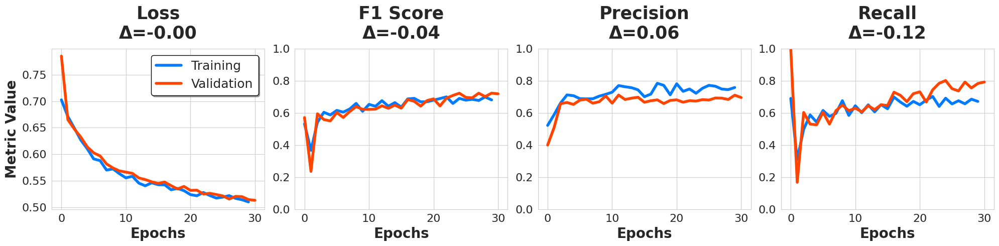

In [46]:
plot_metrics_curves(model)

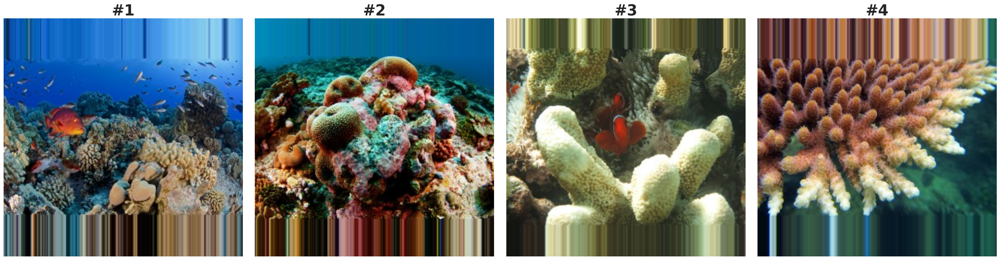

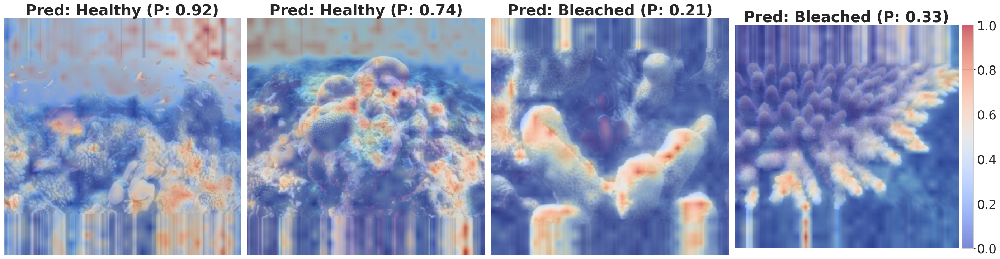

In [47]:
# Example usage with four images
image_paths = [
    'coral_original/healthy_corals/10472474274_1f73391912_o.jpg',
    'coral_original/healthy_corals/12618485353_670ca1b648_o.jpg',
    'coral_original/bleached_corals/25382194631_baca94f8a8_o.jpg',
    'attention_map_pics/attentionmap_example.jpg'
]

# Preprocess all four images
processed_images = [preprocess_single_image(image_path, img_size=300, padding_mode='edge') for image_path in image_paths]

# Plot the original images
plot_original_images(processed_images)
# Visualize the attention maps
visualize_average_attention_maps(model, processed_images)

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

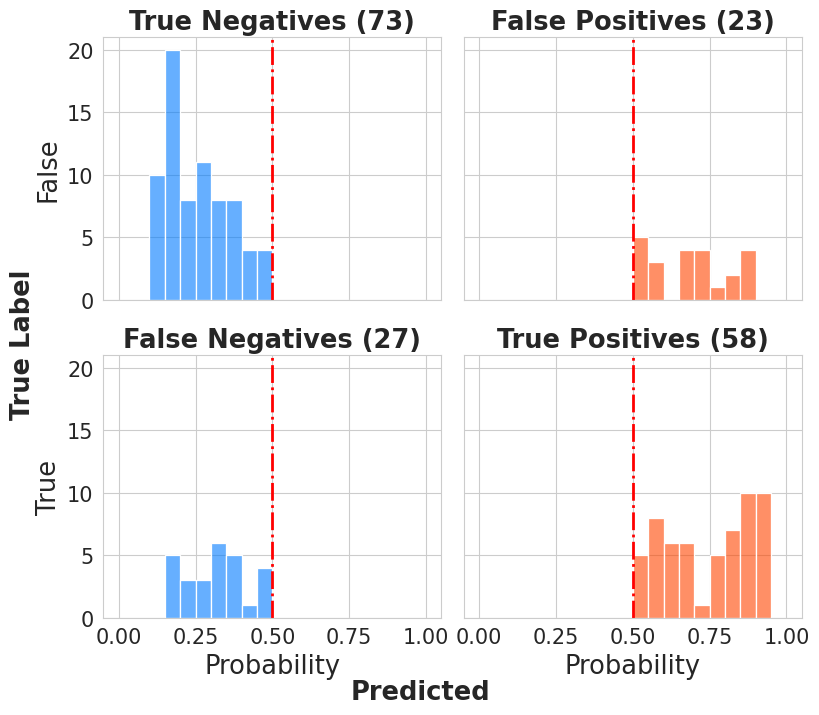

In [52]:
visualize_model_predictions(model=model, data_module=data_module)

### ***`Convolutional`***
---

In [53]:
# Usage
data_module = CoralDataModuleAugmentOnTheFlyPhased(
    data_dir='/notebooks/attention/coral_original',
    batch_size=12, #10
    img_size=300,
    scaler_type='min-max',
    test_size=0.2,
    val_size=0.2,
    num_workers=2,
    padding_modes=['edge', 'reflect'],
    dist_params=distribution_params,  # Pass the calculated parameters here
    use_uniform=True,
    start_augmentation_epoch=10 #10
)
data_module.setup()

# Create the train dataloader and measure its length
train_loader = data_module.train_dataloader()
num_batches = len(train_loader)
print("Number of training batches:", num_batches)

# Determine an appropriate log interval
# Here, I'm setting it to log at least once per epoch or more frequently if desired
log_every_n_steps = max(1, num_batches // 10)


# Set Fourier-specific parameters
fourier_params = {
    'gridsize': 8,                  # 8
    'addbias': True,                # True
    'smooth_initialization': False  # False
}

# Initialize the Vision Transformer Model
model = ViT(
    img_size=300,
    patch_size=16,      #10
    in_channels=3,
    embed_size=68,      #68 
    depth=3,            #3
    heads=4,            #4
    mlp_dim=128,        #128     
    dropout=0.2,        #0.1
    learning_rate=1e-4, #1e-5              
    embedding_type='conv',
    fourier_params=fourier_params
)



# Set up the trainer
trainer = pl.Trainer(
    max_epochs=30,       # before 30
    precision="16-mixed",
    devices=1 if torch.cuda.is_available() else 1,
    accelerator='gpu' if torch.cuda.is_available() else 'cpu',
    log_every_n_steps=log_every_n_steps
)

# Train the model
trainer.fit(model, datamodule=data_module)

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name               | Type              | Params | Mode 
------------------------------------------------------------------
0  | patch_embedding    | PatchEmbedding    | 74.5 K | train
1  | transformer_blocks | Sequential        | 109 K  | train
2  | to_cls_token       | Identity          | 0      | train
3  | mlp_head           | Sequential        | 205    | train
4  | train_accuracy     | BinaryAccuracy    | 0      | train
5  | val_accuracy       | BinaryAccuracy    | 0      | train
6  | test_accuracy      | BinaryAccuracy    | 0      | train
7  | train_f1           | BinaryF1Score     | 0      | train
8  | val_f1             | BinaryF1Score     | 0      | train
9  | test_f1            | BinaryF1Score     | 0      | train
10 | train_precision    | BinaryPrecision   | 0      | trai

Successfully initialized data loaders!
Number of training batches: 46
Successfully initialized data loaders!


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=30` reached.


In [54]:
trainer.test(model, datamodule=data_module)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6850828528404236
         test_f1            0.6045442223548889
        test_loss           0.5910876393318176
     test_precision         0.7094449400901794
       test_recall           0.595501184463501
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.5910876393318176,
  'test_acc': 0.6850828528404236,
  'test_f1': 0.6045442223548889,
  'test_precision': 0.7094449400901794,
  'test_recall': 0.595501184463501}]

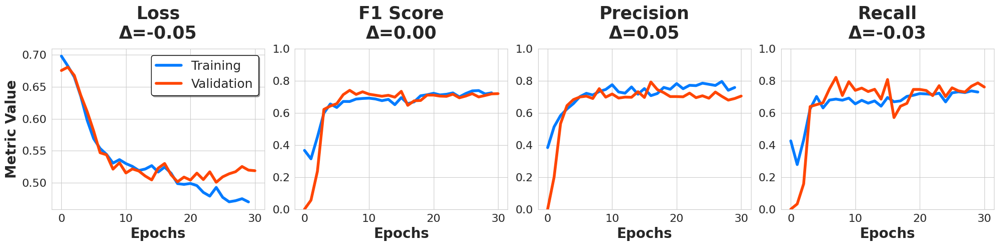

In [55]:
plot_metrics_curves(model)

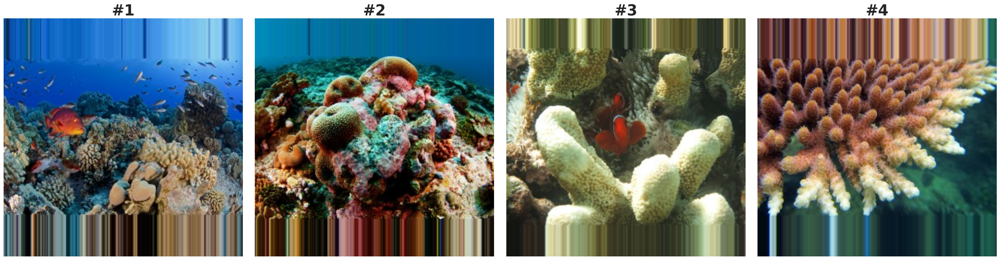

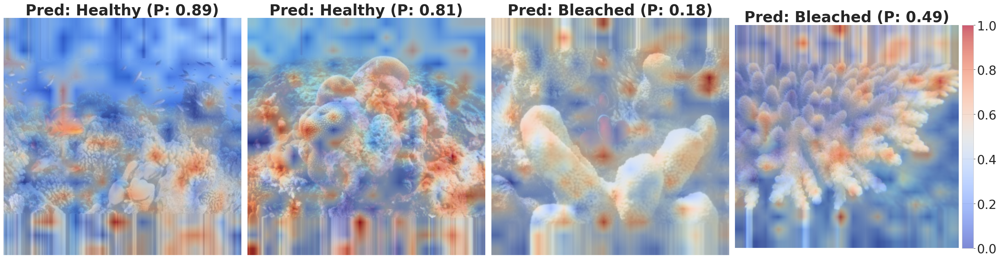

In [57]:
# Example usage with four images
image_paths = [
    'coral_original/healthy_corals/10472474274_1f73391912_o.jpg',
    'coral_original/healthy_corals/12618485353_670ca1b648_o.jpg',
    'coral_original/bleached_corals/25382194631_baca94f8a8_o.jpg',
    'attention_map_pics/attentionmap_example.jpg'
]

# Preprocess all four images
processed_images = [preprocess_single_image(image_path, img_size=300, padding_mode='edge') for image_path in image_paths]

# Plot the original images
plot_original_images(processed_images)
# Visualize the attention maps
visualize_average_attention_maps(model, processed_images)

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

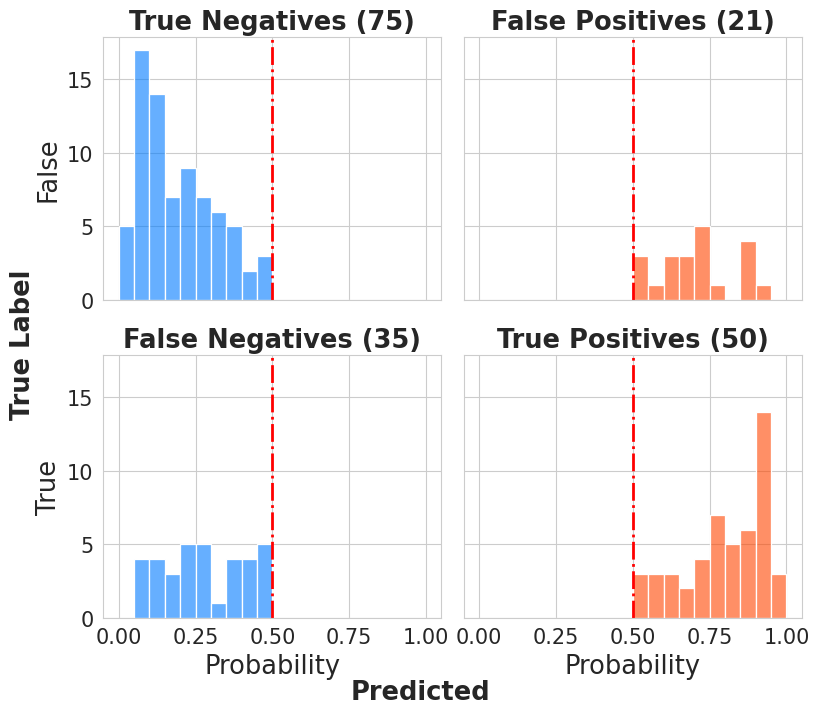

In [56]:
visualize_model_predictions(model, data_module)

### ***`MLP`***
---

In [58]:
# Usage
data_module = CoralDataModuleAugmentOnTheFlyPhased(
    data_dir='/notebooks/attention/coral_original',
    batch_size=12, #10
    img_size=300,
    scaler_type='min-max',
    test_size=0.2,
    val_size=0.2,
    num_workers=2,
    padding_modes=['edge', 'reflect'],
    dist_params=distribution_params,  # Pass the calculated parameters here
    use_uniform=True,
    start_augmentation_epoch=10 #10
)
data_module.setup()

# Create the train dataloader and measure its length
train_loader = data_module.train_dataloader()
num_batches = len(train_loader)
print("Number of training batches:", num_batches)

# Determine an appropriate log interval
# Here, I'm setting it to log at least once per epoch or more frequently if desired
log_every_n_steps = max(1, num_batches // 10)


# Set Fourier-specific parameters
fourier_params = {
    'gridsize': 8,                  # 8
    'addbias': True,                # True
    'smooth_initialization': False  # False
}

# Initialize the Vision Transformer Model
model = ViT(
    img_size=300,
    patch_size=10,      #10
    in_channels=3,
    embed_size=68,      #68 
    depth=3,            #3
    heads=4,            #4
    mlp_dim=128,        #128     
    dropout=0.2,        #0.1
    learning_rate=1e-4, #1e-5              
    embedding_type='linear',
    fourier_params=fourier_params
)



# Set up the trainer
trainer = pl.Trainer(
    max_epochs=30,       # before 30
    precision="16-mixed",
    devices=1 if torch.cuda.is_available() else 1,
    accelerator='gpu' if torch.cuda.is_available() else 'cpu',
    log_every_n_steps=log_every_n_steps
)

# Train the model
trainer.fit(model, datamodule=data_module)

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name               | Type              | Params | Mode 
------------------------------------------------------------------
0  | patch_embedding    | PatchEmbedding    | 81.8 K | train
1  | transformer_blocks | Sequential        | 109 K  | train
2  | to_cls_token       | Identity          | 0      | train
3  | mlp_head           | Sequential        | 205    | train
4  | train_accuracy     | BinaryAccuracy    | 0      | train
5  | val_accuracy       | BinaryAccuracy    | 0      | train
6  | test_accuracy      | BinaryAccuracy    | 0      | train
7  | train_f1           | BinaryF1Score     | 0      | train
8  | val_f1             | BinaryF1Score     | 0      | train
9  | test_f1            | BinaryF1Score     | 0      | train
10 | train_precision    | BinaryPrecision   | 0      | trai

Successfully initialized data loaders!
Number of training batches: 46
Successfully initialized data loaders!


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=30` reached.


In [59]:
trainer.test(model, datamodule=data_module)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.6850828528404236
         test_f1            0.6360501646995544
        test_loss           0.6306151747703552
     test_precision         0.7571164965629578
       test_recall          0.5926334857940674
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.6306151747703552,
  'test_acc': 0.6850828528404236,
  'test_f1': 0.6360501646995544,
  'test_precision': 0.7571164965629578,
  'test_recall': 0.5926334857940674}]

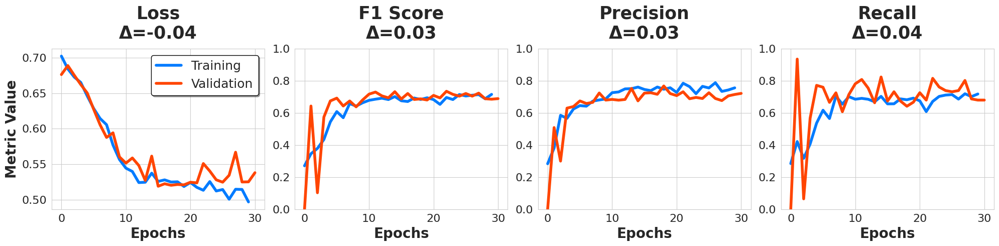

In [60]:
plot_metrics_curves(model)

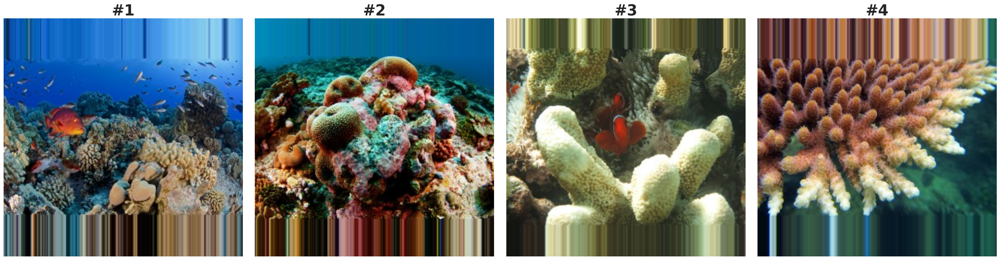

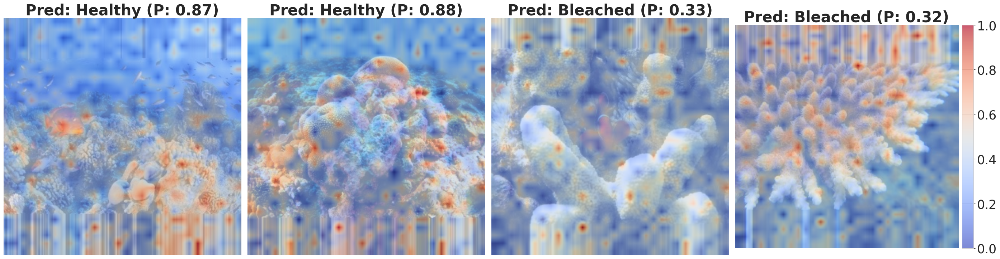

In [61]:
# Example usage with four images
image_paths = [
    'coral_original/healthy_corals/10472474274_1f73391912_o.jpg',
    'coral_original/healthy_corals/12618485353_670ca1b648_o.jpg',
    'coral_original/bleached_corals/25382194631_baca94f8a8_o.jpg',
    'attention_map_pics/attentionmap_example.jpg'
]

# Preprocess all four images
processed_images = [preprocess_single_image(image_path, img_size=300, padding_mode='edge') for image_path in image_paths]

# Plot the original images
plot_original_images(processed_images)
# Visualize the attention maps
visualize_average_attention_maps(model, processed_images)

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

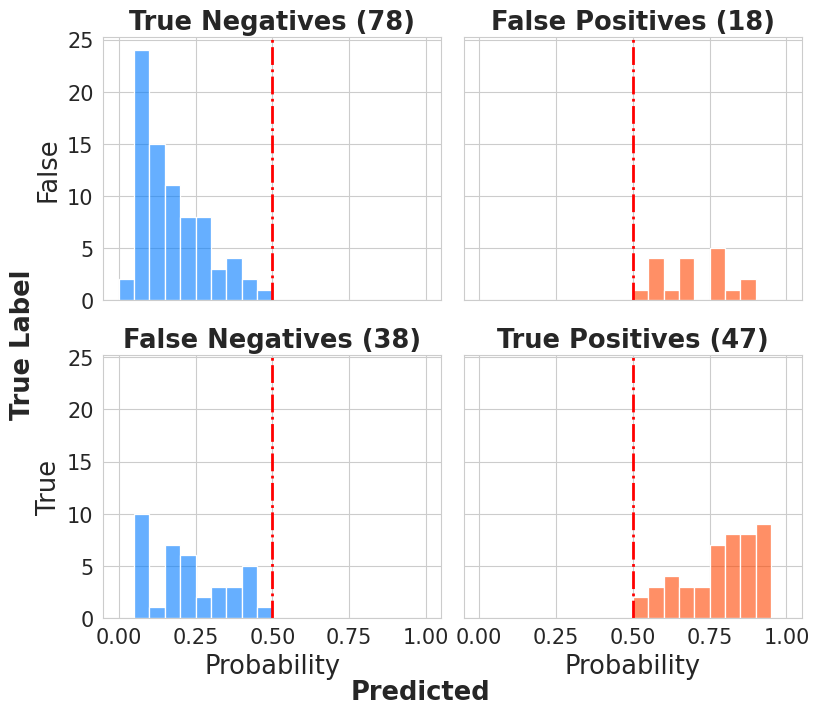

In [62]:
visualize_model_predictions(model, data_module)

### ***`---> Test Perfromance Comparison`***
---

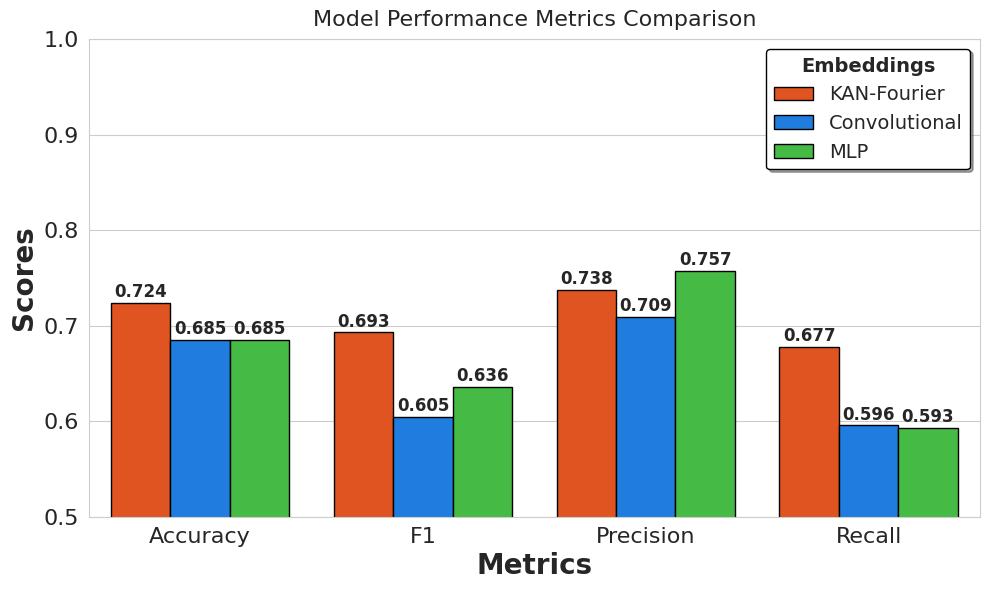

In [63]:
metrics = ['Accuracy', 'F1', 'Precision', 'Recall']
kan_fourier = [0.7237569093704224, 0.6928143501281738, 0.7375690340995789, 0.677387535572052]
convolutional = [0.6850828528404236, 0.6045442223548889, 0.7094449400901794, 0.595501184463501]
mlp = [0.6850828528404236, 0.6360501646995544, 0.7571164965629578, 0.5926334857940674]



# Prepare the data for seaborn
data = {
    'Model': ['KAN-Fourier'] * len(metrics) + ['Convolutional'] * len(metrics) + ['MLP'] * len(metrics),
    'Metrics': metrics * 3,
    'Scores': kan_fourier + convolutional + mlp
}

# Convert to seaborn-friendly format
import pandas as pd
df = pd.DataFrame(data)


blue = "#007BFF"
red = "#FF4500"
# Using seaborn to create the bar plot with manually set colors for each model
plt.figure(figsize=(10, 6))

# Define custom colors for each model
custom_palette = {
    'KAN-Fourier': "#FF4500",   # Blue
    'Convolutional': "#007BFF", # Orange
    'MLP': 'limegreen'            # Green
}

# Create a seaborn barplot with custom colors
sns.barplot(data=df, x='Metrics', y='Scores', hue='Model', palette=custom_palette, edgecolor='black')

# Add titles and labels
plt.xlabel('Metrics', fontsize=20, weight='bold')
plt.ylabel('Scores', fontsize=20, weight='bold')
plt.title('Model Performance Metrics Comparison', fontsize=16, y=1.01)
plt.ylim(0.5, 1)
legend = plt.legend(shadow=True, edgecolor='black', fontsize=14, title='Embeddings', title_fontsize=14)
legend.get_title().set_fontweight('bold')
plt.xticks(fontsize=16)  # Increase x-tick labels size
plt.yticks(fontsize=16)  # Increase y-tick labels size

# Annotate bars with values
for p in plt.gca().patches:
    plt.text(p.get_x() + p.get_width() / 2., p.get_height() + 0.002, f'{p.get_height():.3f}', ha='center', va='bottom', fontsize=12, weight='bold')

# Display the plot
plt.tight_layout()
plt.show();

## `3) More Aggressive Extension`
---

In [47]:
import torch
import random
import pytorch_lightning as pl
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import train_test_split

class RandomAdjustment(torch.nn.Module):
    def __init__(self, actual_dist_params, uniform_params, transform_type):
        super().__init__()
        self.actual_dist_params = actual_dist_params
        self.uniform_params = uniform_params
        self.transform_type = transform_type

    def forward(self, img, label, use_uniform=False):
        class_key = 'bleached' if label == 0 else 'healthy'
        if use_uniform:
            param = random.uniform(*self.uniform_params[self.transform_type])
        else:
            param = random.normalvariate(*self.actual_dist_params[class_key][self.transform_type])

        if self.transform_type == 'brightness':
            img = transforms.functional.adjust_brightness(img, param)
        elif self.transform_type == 'contrast':
            img = transforms.functional.adjust_contrast(img, param)
        elif self.transform_type == 'saturation':
            img = transforms.functional.adjust_saturation(img, param)
        return img

class CoralDataModuleAugmentOnTheFlyPhasedAggressive(pl.LightningDataModule):
    def __init__(self, data_dir, batch_size, img_size, scaler_type, test_size, val_size, num_workers, padding_modes, dist_params, use_uniform=False, start_augmentation_epoch=0):
        super().__init__()
        self.data_dir = data_dir
        self.batch_size = batch_size
        self.img_size = img_size
        self.scaler_type = scaler_type
        self.test_size = test_size
        self.val_size = val_size
        self.num_workers = num_workers
        self.padding_modes = padding_modes
        self.use_uniform = use_uniform
        self.dist_params = dist_params
        self.start_augmentation_epoch = start_augmentation_epoch
        self.current_epoch = 0

        # Initialize adjustment instances
        self.brightness_adjustment = RandomAdjustment(dist_params, {'brightness': (0.5, 1.5)}, 'brightness')
        self.contrast_adjustment = RandomAdjustment(dist_params, {'contrast': (0.5, 1.5)}, 'contrast')
        self.saturation_adjustment = RandomAdjustment(dist_params, {'saturation': (0.5, 1.5)}, 'saturation')

        self.transform = self.get_transform(apply_augmentation=False)
        self.train_transform = self.get_transform(apply_augmentation=True)

    def custom_pad(self, img):
        left = top = right = bottom = 0
        if img.width < self.img_size or img.height < self.img_size:
            delta_w = max(self.img_size - img.width, 0)
            delta_h = max(self.img_size - img.height, 0)
            left = delta_w // 2
            right = delta_w - left
            top = delta_h // 2
            bottom = delta_h - top
        # Switch between different padding modes randomly
        padding_mode = random.choice(self.padding_modes)
        return transforms.functional.pad(img, (left, top, right, bottom), padding_mode=padding_mode)

    def get_transform(self, apply_augmentation=False):
        base_transforms = [
            transforms.Lambda(self.custom_pad),
            transforms.Resize((self.img_size, self.img_size)),
            transforms.ToTensor(),
        ]
        
        if apply_augmentation:
            augmentation_transforms = [
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomVerticalFlip(p=0.2),
                transforms.RandomRotation(degrees=30),
                transforms.RandomAffine(degrees=20, translate=(0.1, 0.1), scale=(0.8, 1.2), shear=(10, 10)),
                transforms.RandomResizedCrop(size=self.img_size, scale=(0.8, 1.0)),
                transforms.RandomGrayscale(p=0.2),
                lambda x, y: (self.apply_adjustment(x, y), y),
                transforms.Lambda(lambda img: img + torch.randn_like(img) * 0.1)  # Gaussian noise
            ]
            return transforms.Compose(augmentation_transforms + base_transforms)
        else:
            return transforms.Compose(base_transforms)

    def apply_adjustment(self, img, label):
        img = self.brightness_adjustment(img, label, use_uniform=self.use_uniform)
        img = self.contrast_adjustment(img, label, use_uniform=self.use_uniform)
        img = self.saturation_adjustment(img, label, use_uniform=self.use_uniform)
        return img

    def on_train_epoch_start(self):
        """ Dynamically update the transform based on the current epoch. """
        if self.current_epoch >= self.start_augmentation_epoch:
            self.train_dataset.dataset.transform = self.train_transform
        else:
            self.train_dataset.dataset.transform = self.get_transform(apply_augmentation=False)
        self.current_epoch += 1

    def setup(self, stage=None):
        if stage == 'fit' or stage is None:
            full_dataset = datasets.ImageFolder(root=self.data_dir, is_valid_file=lambda x: x.endswith(('.jpg', '.jpeg', '.png')))
            
            train_idx, val_idx = train_test_split(
                range(len(full_dataset)),
                test_size=self.val_size + self.test_size,
                shuffle=True,
                stratify=full_dataset.targets,
            )
            
            self.train_dataset = Subset(full_dataset, train_idx)
            self.train_dataset.dataset.transform = self.train_transform
            
            val_test_idx, test_idx = train_test_split(
                val_idx,
                test_size=self.test_size / (self.val_size + self.test_size),
                shuffle=True,
                stratify=[full_dataset.targets[i] for i in val_idx]
            )
            
            self.val_dataset = Subset(full_dataset, val_test_idx)
            self.val_dataset.dataset.transform = self.transform
            self.test_dataset = Subset(full_dataset, test_idx)
            self.test_dataset.dataset.transform = self.transform
            print("Successfully initialized data loaders!")

    def train_dataloader(self):
        return DataLoader(self.train_dataset, batch_size=self.batch_size, shuffle=True, num_workers=self.num_workers, pin_memory=True)

    def val_dataloader(self):
        return DataLoader(self.val_dataset, batch_size=self.batch_size, shuffle=False, num_workers=self.num_workers, pin_memory=True)

    def test_dataloader(self):
        return DataLoader(self.test_dataset, batch_size=self.batch_size, shuffle=False, num_workers=self.num_workers, pin_memory=True)


In [48]:
# Usage
data_module = CoralDataModuleAugmentOnTheFlyPhasedAggressive(
    data_dir='/notebooks/attention/coral_original',
    batch_size=10, #10
    img_size=300,
    scaler_type='min-max',
    test_size=0.2,
    val_size=0.2,
    num_workers=2,
    padding_modes= ['edge', 'reflect'],
    dist_params=distribution_params,  # Pass the calculated parameters here
    use_uniform=True,
    start_augmentation_epoch=10 #10
)
data_module.setup()

# Create the train dataloader and measure its length
train_loader = data_module.train_dataloader()
num_batches = len(train_loader)
print("Number of training batches:", num_batches)

# Determine an appropriate log interval
# Here, I'm setting it to log at least once per epoch or more frequently if desired
log_every_n_steps = max(1, num_batches // 10)


# Set Fourier-specific parameters
fourier_params = {
    'gridsize': 8,                  # 8
    'addbias': True,                # True
    'smooth_initialization': False  # False
}

# Initialize the Vision Transformer Model
model = ViT(
    img_size=300,
    patch_size=10,      #10
    in_channels=3,
    embed_size=68,      #68 
    depth=3,            #3
    heads=4,            #4
    mlp_dim=128,        #128     
    dropout=0.1,        #0.1
    learning_rate=1e-5, #1e-5              
    embedding_type='fourier',
    fourier_params=fourier_params
)



# Set up the trainer
trainer = pl.Trainer(
    max_epochs=30,       # before 30
    precision="16-mixed",
    devices=1 if torch.cuda.is_available() else 1,
    accelerator='gpu' if torch.cuda.is_available() else 'cpu',
    log_every_n_steps=log_every_n_steps
)

# Train the model
trainer.fit(model, datamodule=data_module)

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name               | Type              | Params | Mode 
------------------------------------------------------------------
0  | patch_embedding    | PatchEmbedding    | 387 K  | train
1  | transformer_blocks | Sequential        | 109 K  | train
2  | to_cls_token       | Identity          | 0      | train
3  | mlp_head           | Sequential        | 205    | train
4  | train_accuracy     | BinaryAccuracy    | 0      | train
5  | val_accuracy       | BinaryAccuracy    | 0      | train
6  | test_accuracy      | BinaryAccuracy    | 0      | train
7  | train_f1           | BinaryF1Score     | 0      | train
8  | val_f1             | BinaryF1Score     | 0      | train
9  | test_f1            | BinaryF1Score     | 0      | train
10 | train_precision    | BinaryPrecision   | 0      | trai

Successfully initialized data loaders!
Number of training batches: 55
Successfully initialized data loaders!


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=30` reached.


In [49]:
trainer.test(model, datamodule=data_module)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
        test_acc            0.7237569093704224
         test_f1            0.6395120620727539
        test_loss           0.5277434587478638
     test_precision         0.7342804074287415
       test_recall          0.6128650307655334
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


[{'test_loss': 0.5277434587478638,
  'test_acc': 0.7237569093704224,
  'test_f1': 0.6395120620727539,
  'test_precision': 0.7342804074287415,
  'test_recall': 0.6128650307655334}]

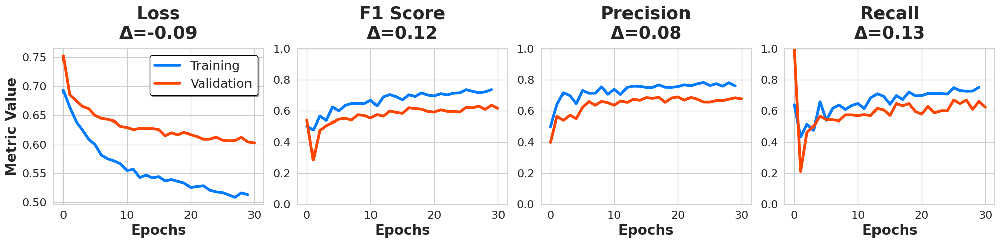

In [46]:
plot_metrics_curves(model)